<a href="https://colab.research.google.com/github/Joovvhan/Master-Thesis/blob/master/log/(FAN)%20TSNE%20PCA%202D.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
# Import necessary modules

import os
import matplotlib.pyplot as plt
import numpy as np
import scipy.io.wavfile as wf
import time
import glob
import datetime

from tqdm import trange

# Import Keras modules

from keras.preprocessing import image
from keras.layers import Input, Flatten, Dense, Dropout, GlobalAveragePooling2D
from keras.models import Sequential
from keras import backend as K
from keras.models import load_model


In [4]:
from keras.models import load_model

# Set model path

modelPath = 'gdrive/My Drive/Colab/Model'

dataPath = 'gdrive/My Drive/Colab/Data'

dataPath = '''D:\\0_Joowhan's Paper\\Real Data\\Split Data'''
modelPath = '''D:\\0_Joowhan's Paper\\Real Data\\Model'''

modelList = glob.glob(modelPath + '/*h5')
    
numberModel = np.inf
    
while numberModel >= len(modelList): 

    for i in range(len(modelList)):
        print('#{:d}: {}'.format(i, modelList[i]))
    
    numberModel = int(input('Type In Your Model Number:\n'))

    if numberModel < len(modelList):
        print('Loading {}'.format(modelList[numberModel]))    
        model = load_model(modelList[numberModel])
        print('Loading Completed')    
    else:
        print('Invalid Model Number\n')

#0: D:\0_Joowhan's Paper\Real Data\Model\['1Mass']-['5Mass']_Xception_11-24-21-07-37.h5
Type In Your Model Number:
0
Loading D:\0_Joowhan's Paper\Real Data\Model\['1Mass']-['5Mass']_Xception_11-24-21-07-37.h5
Loading Completed


In [6]:
creationDate = modelList[numberModel].split('_')[-1].replace('.h5', '')

modelParamList = glob.glob(modelPath + '/*.npy')
modelParam = [param for param in modelParamList if creationDate in param]

print('Parameter npy File List: {}'.format(modelParam))

trainMean = float(np.load([param for param in modelParam if 'mean' in param][0]))
trainStd = float(np.load([param for param in modelParam if 'std' in param][0]))

Parameter npy File List: ["D:\\0_Joowhan's Paper\\Real Data\\Model\\mean_11-24-21-07-37.npy", "D:\\0_Joowhan's Paper\\Real Data\\Model\\std_11-24-21-07-37.npy"]


In [8]:
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
xception (Model)             (None, 7, 7, 2048)        20861480  
_________________________________________________________________
global_average_pooling2d_1 ( (None, 2048)              0         
_________________________________________________________________
dense_1 (Dense)              (None, 2)                 4098      
Total params: 20,865,578
Trainable params: 20,811,050
Non-trainable params: 54,528
_________________________________________________________________


In [0]:
from keras.models import Model

layer_name = 'flatten_1'

layer_name = 'global_average_pooling2d_1'

intermediate_layer_model = Model(inputs=model.input,
                                 outputs=model.get_layer(layer_name).output)

In [43]:
pathNormal = list()
pathFault = list()

folderNormal = ['1Mass']
folderFault = ['5Mass']

pathFaults = [dataPath + '/' + folder for folder in folderFault]
pathNormals = [dataPath + '/' + folder for folder in folderNormal]

for i in range(len(pathNormals)):

    npyNormalPath = glob.glob(pathNormals[i] + '/' + '*Image_With_Label*.npy')
    
    randomPick = np.random.choice(len(npyNormalPath), 5, replace=False)
    randomPick.sort()
    
    counter = 0
    
    for k in randomPick:
    
        data = np.load(npyNormalPath[k])

        imgs = np.moveaxis(np.dstack(data[:, 0]), 2, 0)

        label = data[:, 1]

        if counter == 0:
            labelListNormal = label
        else:
            labelListNormal = np.concatenate([labelListNormal, label])

        print('Normal Image Shape From {}: {}'.format(folderNormal[i], data.shape))    

        testImgsNorm = (imgs - trainMean) / trainStd

        testImgsNorm = testImgsNorm.reshape(list(testImgsNorm.shape) + [1])

        X_test_ = np.stack([testImgsNorm[:, :, :, 0], testImgsNorm[:, :, :, 0], testImgsNorm[:, :, :, 0]], axis = -1)

        intermediate_features = intermediate_layer_model.predict(X_test_)

        if counter == 0:
            normal_features = intermediate_features
            counter = counter + 1
        else:
            normal_features = np.vstack((normal_features, intermediate_features))

        print('Predicted {}/{}'.format(i + 1, len(npyNormalPath)))    
        print('normal_features Shape{}'.format(normal_features.shape))
        print('labelList Shape{}'.format(labelListNormal.shape))

        del imgs, data

Normal Image Shape From 1Mass: (240, 2)
Predicted 1/20
normal_features Shape(240, 2048)
labelList Shape(240,)
Normal Image Shape From 1Mass: (240, 2)
Predicted 1/20
normal_features Shape(480, 2048)
labelList Shape(480,)
Normal Image Shape From 1Mass: (240, 2)
Predicted 1/20
normal_features Shape(720, 2048)
labelList Shape(720,)
Normal Image Shape From 1Mass: (240, 2)
Predicted 1/20
normal_features Shape(960, 2048)
labelList Shape(960,)
Normal Image Shape From 1Mass: (240, 2)
Predicted 1/20
normal_features Shape(1200, 2048)
labelList Shape(1200,)


In [92]:
for i in range(len(pathFaults)):

    npyFaultPath = glob.glob(pathFaults[i] + '/' + '*Image_With_Label*.npy')
    
    randomPick = np.random.choice(len(npyFaultPath), 5, replace=False)
    randomPick.sort()
    
    counter = 0
    
    for k in randomPick:
    
        data = np.load(npyFaultPath[k])

        imgs = np.moveaxis(np.dstack(data[:, 0]), 2, 0)

        label = data[:, 1]

        if counter == 0:
            labelListFault = label
        else:
            labelListFault = np.concatenate([labelListFault, label])

        print('Fault Image Shape From {}: {}'.format(folderFault[i], data.shape))    

        testImgsNorm = (imgs - trainMean) / trainStd

        testImgsNorm = testImgsNorm.reshape(list(testImgsNorm.shape) + [1])

        X_test_ = np.stack([testImgsNorm[:, :, :, 0], testImgsNorm[:, :, :, 0], testImgsNorm[:, :, :, 0]], axis = -1)

        intermediate_features = intermediate_layer_model.predict(X_test_)

        if counter == 0:
            fault_features = intermediate_features
            counter = counter + 1
        else:
            fault_features = np.vstack((fault_features, intermediate_features))

        print('Predicted {}/{}'.format(i + 1, len(npyFaultPath)))    
        print('fault_features Shape{}'.format(fault_features.shape))
        print('labelList Shape{}'.format(labelListFault.shape))

        del imgs, data

Fault Image Shape From 5Mass: (240, 2)
Predicted 1/25
fault_features Shape(240, 2048)
labelList Shape(240,)
Fault Image Shape From 5Mass: (240, 2)
Predicted 1/25
fault_features Shape(480, 2048)
labelList Shape(480,)
Fault Image Shape From 5Mass: (240, 2)
Predicted 1/25
fault_features Shape(720, 2048)
labelList Shape(720,)
Fault Image Shape From 5Mass: (240, 2)
Predicted 1/25
fault_features Shape(960, 2048)
labelList Shape(960,)
Fault Image Shape From 5Mass: (240, 2)
Predicted 1/25
fault_features Shape(1200, 2048)
labelList Shape(1200,)


In [72]:
pathTest = list()

# folderTest = ['A3F1P3', 'A3F2P3', 'A3F3P3', 'A3F4P3', 'A3F5P3']

folderTest = ['1Mass', '2Mass', '3Mass', '4Mass', '5Mass']

for i in range(len(folderTest)):
    pathTest.append(dataPath + '/' + folderTest[i])
    
pathTests = [dataPath + '/' + folder for folder in folderTest]

count = 0

for i in range(len(pathTests)):

    npyTestPath = glob.glob(pathTests[i] + '/' + '*Image_With_Label*.npy')
    
    randomPick = np.random.choice(len(npyTestPath), 5, replace=False)
    randomPick.sort()
    
    for j in randomPick:
    
        data = np.load(npyTestPath[j])

        imgs = np.moveaxis(np.dstack(data[:, 0]), 2, 0)

        label = data[:, 1]

        if count == 0:
            labelListTest = label
        else:
            labelListTest = np.concatenate([labelListTest, label])

        print('Test Image Shape From {}: {}'.format(folderTest[i], data.shape))    

        testImgsNorm = (imgs - trainMean) / trainStd

        testImgsNorm = testImgsNorm.reshape(list(testImgsNorm.shape) + [1])

        X_test_ = np.stack([testImgsNorm[:, :, :, 0], testImgsNorm[:, :, :, 0], testImgsNorm[:, :, :, 0]], axis = -1)

        intermediate_features = intermediate_layer_model.predict(X_test_)


        if count == 0:
            test_features = intermediate_features
            count = count + 1
        else:
            test_features = np.vstack((test_features, intermediate_features))

        print('Predicted {}/{}'.format(i + 1, len(npyTestPath)))    
        print('fault_features Shape{}'.format(test_features.shape))
        print('labelList Shape{}'.format(labelListTest.shape))

        del imgs, data

Test Image Shape From 1Mass: (240, 2)
Predicted 1/20
fault_features Shape(240, 2048)
labelList Shape(240,)
Test Image Shape From 1Mass: (240, 2)
Predicted 1/20
fault_features Shape(480, 2048)
labelList Shape(480,)
Test Image Shape From 1Mass: (240, 2)
Predicted 1/20
fault_features Shape(720, 2048)
labelList Shape(720,)
Test Image Shape From 1Mass: (240, 2)
Predicted 1/20
fault_features Shape(960, 2048)
labelList Shape(960,)
Test Image Shape From 1Mass: (240, 2)
Predicted 1/20
fault_features Shape(1200, 2048)
labelList Shape(1200,)
Test Image Shape From 2Mass: (240, 2)
Predicted 2/39
fault_features Shape(1440, 2048)
labelList Shape(1440,)
Test Image Shape From 2Mass: (240, 2)
Predicted 2/39
fault_features Shape(1680, 2048)
labelList Shape(1680,)
Test Image Shape From 2Mass: (240, 2)
Predicted 2/39
fault_features Shape(1920, 2048)
labelList Shape(1920,)
Test Image Shape From 2Mass: (240, 2)
Predicted 2/39
fault_features Shape(2160, 2048)
labelList Shape(2160,)
Test Image Shape From 2Mass

In [0]:
import numpy as np
from sklearn.manifold import TSNE

test_features

tsne = TSNE(n_components = 2, random_state = 0)
full_tsne_result = tsne._fit(test_features)

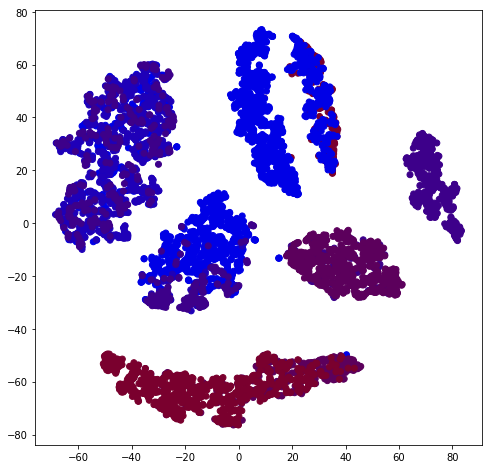

In [74]:
red = np.array([0.6, 0, 0, 0.2])
blue = np.array([0, 0, 0.9, 0.2])

red = np.array([0.6, 0, 0, 1])
blue = np.array([0, 0, 0.9, 1])

Y_label = np.concatenate([np.zeros(1000), 0.2 * np.ones(1000), 0.4 * np.ones(1000), 0.6 * np.ones(1000), 0.8 * np.ones(1000)])

clusterColor = [red * label + blue * (1 - label) for label in Y_label]

plt.figure(figsize=(8, 8))
plt.scatter(x = full_tsne_result[:, 0], y=full_tsne_result[:, 1], color=clusterColor)


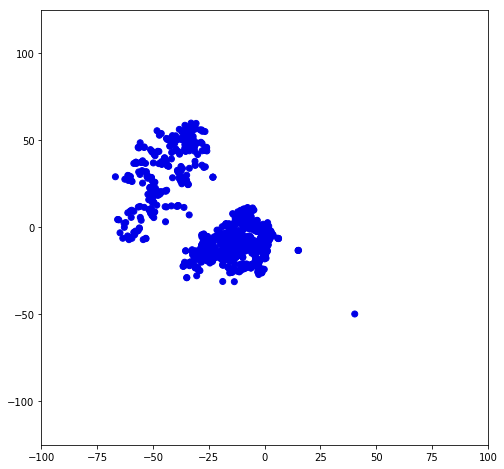

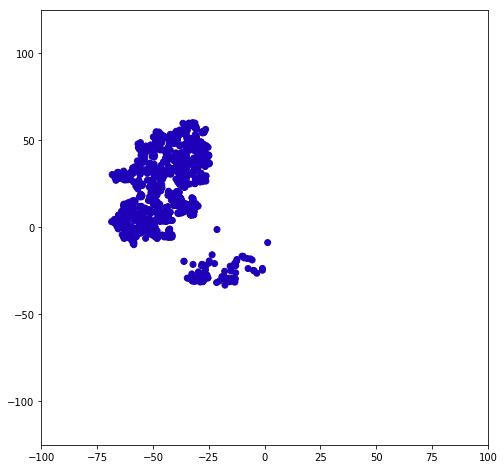

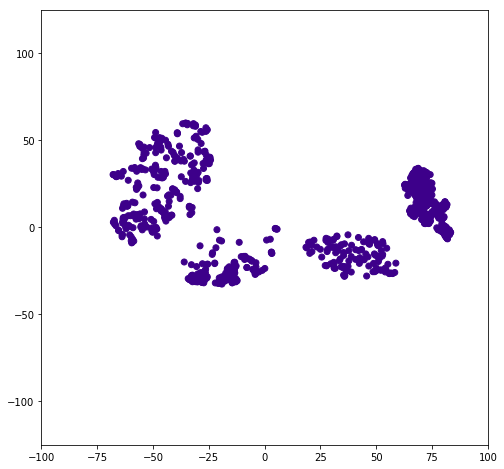

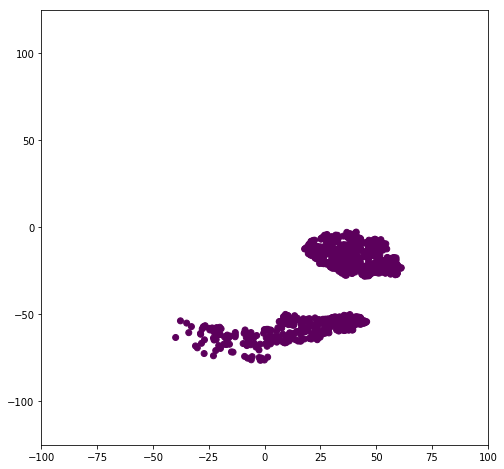

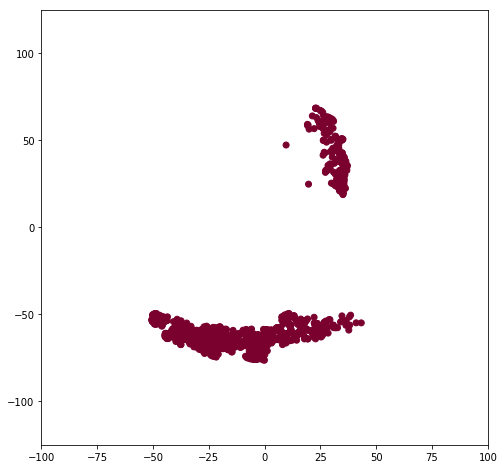

In [75]:
for i in range(0, 5000, 1000):

    plt.figure(figsize=(8, 8))
    plt.scatter(x = full_tsne_result[i:i+1000, 0], y=full_tsne_result[i:i+1000, 1], color=clusterColor[i:i+1000])
    plt.xlim([-100, 100])
    plt.ylim([-125, 125])
    plt.show()

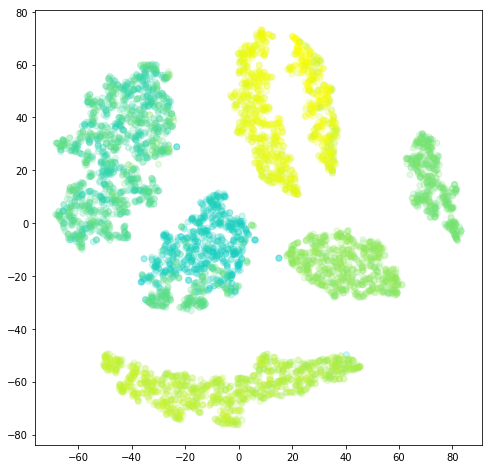

In [76]:
from operator import itemgetter

TSNE_table = full_tsne_result[:, :]

# TSNE_table = np.concatenate((full_tsne_result[:, :], labelListTest[:]), axis = 1)

# TSNE_table_sorted = np.asarray(sorted(TSNE_table, key = itemgetter(3)))

# itemgetter
# 2: Amplitude
# 3: Frequency
# 4: Modulation
# 5: Harmonic

colorYellow = np.asarray([1, 1, 0, 0.2])
colorBGreen = np.asarray([0, 0.8, 0.8, 0.2])

clusterColor_ = np.asarray([colorYellow * i/len(TSNE_table) + colorBGreen * (1 - i/len(TSNE_table)) for i in range(len(TSNE_table))])

plt.figure(figsize=(8, 8))
# plt.scatter(x = pca_result[:, 0], y=pca_result[:, 1], color=clusterColor)
plt.scatter(x = TSNE_table[:,0], y=TSNE_table[:,1], color=clusterColor_)

In [77]:
TSNE_table.shape

(6000, 2)

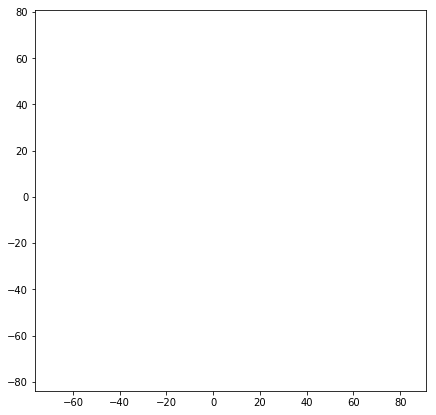

In [81]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
import matplotlib.animation as animation
from matplotlib import animation, rc
from IPython.display import display, HTML

rc('animation', html='jshtml')

# Create new Figure and an Axes which fills it.
fig = plt.figure(figsize=(7, 7))
# ax = fig.add_axes([0, 0, 1, 1])
ax = fig.add_subplot(111)
# ax.set_xlim(-5, 10)
# ax.set_ylim(-5, 5)
# Construct the scatter which we will update during animation
# as the raindrops develop.
x, y = [], []

scat = ax.scatter(TSNE_table[:, 0], TSNE_table[:, 1], color = clusterColor_)

def update(frame_number):
    x = TSNE_table[:frame_number,0]
    y = TSNE_table[:frame_number,1]
    scat.set_offsets(np.c_[x, y])

    return scat,

# Construct the animation, using the update function as the animation
# director.
animation = FuncAnimation(fig, update, frames=np.asarray(range(0,len(TSNE_table), int(len(TSNE_table)/100))), interval=100)

In [82]:
animation

In [0]:
import numpy as np
from sklearn.decomposition import PCA

pca = PCA(n_components=3)
pca_result = pca.fit_transform(np.vstack((normal_features, fault_features)))

[0.97203314 0.01482876 0.0087603 ]
[222.74258   27.511557  21.145706]


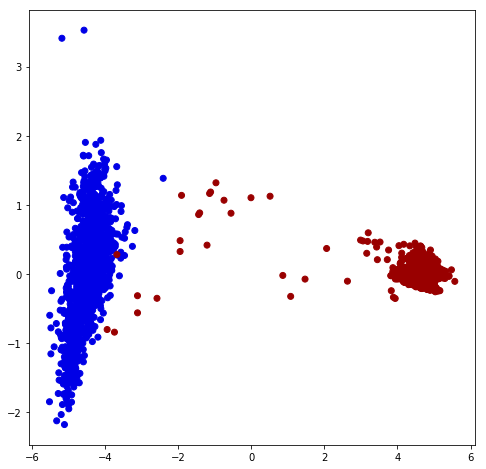

In [107]:
print(pca.explained_variance_ratio_)  

print(pca.singular_values_)  

red = np.array([0.6, 0, 0, 1])
blue = np.array([0, 0, 0.9, 1])

Y_label = np.append(np.zeros(normal_features.shape[0]), np.ones(fault_features.shape[0]))

clusterColor = [red * label + blue * (1 - label) for label in Y_label]

plt.figure(figsize=(8, 8))
plt.scatter(x = pca_result[:, 0], y=pca_result[:, 1], color=clusterColor)
plt.show()

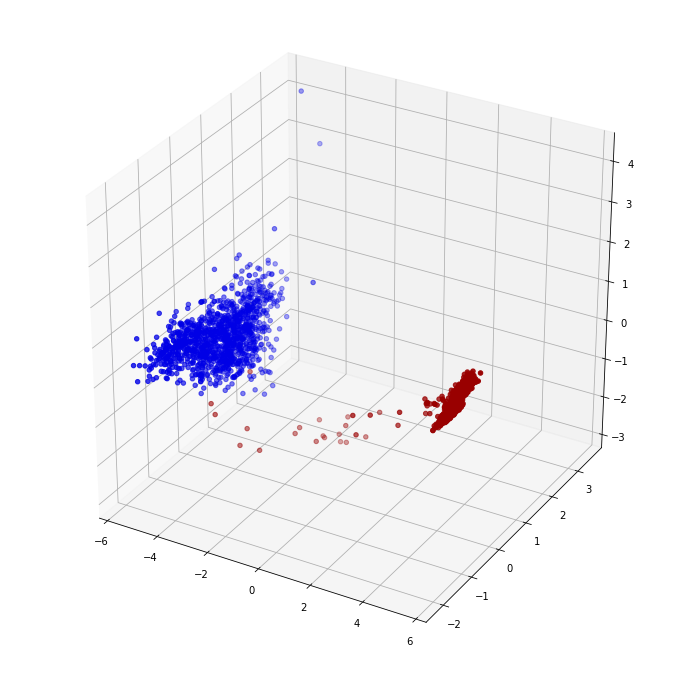

In [118]:
from mpl_toolkits.mplot3d import Axes3D  
fig = plt.figure(figsize=(12, 12))

ax = fig.add_subplot(111, projection='3d')

ax.scatter(pca_result[:, 0], pca_result[:, 1], pca_result[:, 2], color=clusterColor)
plt.show()

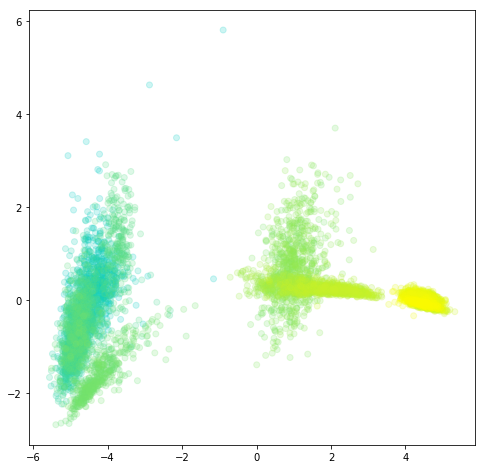

In [98]:
pca_chunk = pca.transform(test_features)

plt.figure(figsize=(8, 8))
plt.scatter(x = pca_chunk[:, 0], y=pca_chunk[:, 1], color=clusterColor_)

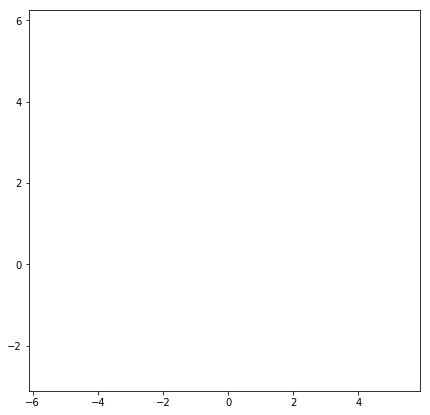

In [99]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
import matplotlib.animation as animation
from matplotlib import animation, rc
from IPython.display import display, HTML

rc('animation', html='jshtml')

# Create new Figure and an Axes which fills it.
fig = plt.figure(figsize=(7, 7))
# ax = fig.add_axes([0, 0, 1, 1])
ax = fig.add_subplot(111)
# ax.set_xlim(-5, 10)
# ax.set_ylim(-5, 5)
# Construct the scatter which we will update during animation
# as the raindrops develop.
x, y = [], []

scat = ax.scatter(pca_chunk[:, 0], pca_chunk[:, 1], color = clusterColor_)

def update(frame_number):
    x = pca_chunk[:frame_number,0]
    y = pca_chunk[:frame_number,1]
    scat.set_offsets(np.c_[x, y])

    return scat,

# Construct the animation, using the update function as the animation
# director.
animation = FuncAnimation(fig, update, frames=np.asarray(range(0,len(pca_chunk), int(len(pca_chunk)/100))), interval=100)

In [100]:
animation